In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import os
import sys
import networkx as nx
from itertools import combinations
import matplotlib.patches as patches

In [2]:
# Config
LABEL_EP_FIB = True
SHOW_IMAGE = False
SHOW_PATCHES = True
SHOW_CELL_GRAPH = True
SHOW_TRIANGLE_GRAPH = True

In [23]:
tile = 'P11_2_2'
task = 'Test/'
edges = 'Datasets/'+ task + tile + '_delaunay_orig_forGraphSAGE_edges.csv'
nodes = 'Datasets/'+ task + tile + '_delaunay_orig_forGraphSAGE_nodes.csv'
image_path = '../../IntelliGraph/slides/' + tile + '.tif' 

def read_data(nodes, edges):
    with open(edges, 'r') as f:
        first_line = f.readline()
        edges_cols = first_line.split(',')
        edges_cols = [col.strip() for col in edges_cols]
        edges_cols = [col.strip('"') for col in edges_cols]
    
    # read the first line of edges file to get columns names
    with open(nodes, 'r') as f:
        first_line = f.readline()
        nodes_cols = first_line.split(',')
        nodes_cols = [col.strip() for col in nodes_cols]
        nodes_cols = [col.strip('"') for col in nodes_cols]
    print(edges_cols)
    print(nodes_cols)
    edges_df = pd.read_csv(edges, header=None, names=edges_cols)[1:]
    nodes_df = pd.read_csv(nodes, header=None, names=nodes_cols)[1:]

    return nodes_df, edges_df

nodes_df, edges_df = read_data(nodes, edges)

edges_df['source'] = edges_df['source'].astype(int)
edges_df['target'] = edges_df['target'].astype(int)
edges_df['type'] = edges_df['type'].astype(int)
edges_df['distance'] = edges_df['distance'].astype(float)

nodes_df['id'] = nodes_df['id'].astype(int)
nodes_df['lym'] = nodes_df['lym'].astype(float)
nodes_df['epi'] = nodes_df['epi'].astype(float)
nodes_df['fib'] = nodes_df['fib'].astype(float)
nodes_df['inf'] = nodes_df['inf'].astype(float)
nodes_df['x'] = nodes_df['x'].astype(float)
nodes_df['y'] = nodes_df['y'].astype(float)

['source', 'target', 'type', 'distance', 'Delta_Entropy', 'Sorenson_Similarity']
['id', 'lym', 'epi', 'fib', 'inf', 'x', 'y', 'gt', 'Cell_density', 'Node_Entropy']


In [24]:
# Load and preprocess the image
image = plt.imread(image_path)
image = image[:, :, 0:3]

if SHOW_IMAGE:
    plt.figure(figsize=(10,10))
    plt.imshow(image)
    plt.show()

In [25]:
if LABEL_EP_FIB:
    for index, row in edges_df.iterrows():
        if row.type == 0:
            if nodes_df.loc[nodes_df.id == row.source, 'gt'].values[0] == 'epithelial' and nodes_df.loc[nodes_df.id == row.target, 'gt'].values[0] == 'fibroblast and endothelial':
                row.type = 2
                edges_df.loc[(edges_df.source == row.source) & (edges_df.target == row.target), 'type'] = 2
                #print(row.type)
            elif nodes_df.loc[nodes_df.id == row.source, 'gt'].values[0] == 'fibroblast and endothelial' and nodes_df.loc[nodes_df.id == row.target, 'gt'].values[0] == 'epithelial':
                row.type = 2
                #print(row.type)
                edges_df.loc[(edges_df.source == row.source) & (edges_df.target == row.target), 'type'] = 2
        

In [26]:
# Cell-Graph model
G = nx.Graph()
#G.add_nodes_from(nodes,)
for index, row in nodes_df.iterrows():
    G.add_node(row['id'], type=row['gt'], coords=(row['x'], row['y']))


#G.add_edges_from(edges_df[['source', 'target']].values, )

for u,v,d in edges_df[['source', 'target', 'type']].values:
    G.add_edge(u, v, label=d)

In [27]:
pos = nodes_df[['x', 'y']].values
gt = nodes_df['gt'].values
color = {'epithelial': 'red', 'fibroblast and endothelial': 'blue', 'inflammatory': 'green', 'lymphocyte': 'yellow', 'apoptosis / civiatte body': 'black'}
node_colors = [color[label] for label in gt]

edge_color = {0:'black', 1: 'red', 2: 'blue'}#
edge_types = edges_df['type'].values
edge_colors = [edge_color[int(label)] for u, v, label in G.edges.data('label')]


In [28]:
if SHOW_IMAGE:
    # Create a figure and axis object
    fig, ax = plt.subplots()

    # Figure size 20,20
    fig.set_size_inches(20, 20)

    # Plot the image
    ax.imshow(image)
    nx.draw(G, pos, node_size=2, width= 0.5, node_color=[color[gt[i]] for i in range(len(gt))], edge_color=edge_colors )


In [29]:
# Find all triangles
triangles = []
 
for node in G.nodes:
    neighbors = list(G.neighbors(node))
    for u, v in combinations(neighbors, 2):
        if G.has_edge(u, v):
            triangles.append(sorted([node, u, v]))      

# Remove duplicate triangles
unique_triangles = [list(x) for x in set(tuple(x) for x in triangles)]

# Create a pandas DataFrame
triangle_df = pd.DataFrame(unique_triangles, columns=['Node1', 'Node2', 'Node3'])

In [30]:
# Fill info about the nodes
for idx, row in triangle_df.iterrows():
    node1_xy = nodes_df.loc[nodes_df['id'] == row['Node1'], ['x','y']].iloc[0].values
    node2_xy = nodes_df.loc[nodes_df['id'] == row['Node2'], ['x','y']].iloc[0].values
    node3_xy = nodes_df.loc[nodes_df['id'] == row['Node3'], ['x','y']].iloc[0].values

    node1_gt = nodes_df.loc[nodes_df['id'] == row['Node1'], ['gt']].iloc[0].values
    node2_gt = nodes_df.loc[nodes_df['id'] == row['Node2'], ['gt']].iloc[0].values
    node3_gt = nodes_df.loc[nodes_df['id'] == row['Node3'], ['gt']].iloc[0].values
 

    triangle_df.loc[idx, ['x1','y1']] = node1_xy
    triangle_df.loc[idx, ['x2','y2']] = node2_xy
    triangle_df.loc[idx, ['x3','y3']] = node3_xy

    triangle_df.loc[idx, ['gt1']] = node1_gt
    triangle_df.loc[idx, ['gt2']] = node2_gt
    triangle_df.loc[idx, ['gt3']] = node3_gt

    count = 0
    c = 0
    if edges_df[(edges_df['source'] == row['Node1']) & (edges_df['target'] == row['Node2']) | 
             (edges_df['source'] == row['Node2']) & (edges_df['target'] == row['Node1'])]['type'].values[0] == 1:
        count +=1
    if edges_df[(edges_df['source'] == row['Node1']) & (edges_df['target'] == row['Node3']) |
                (edges_df['source'] == row['Node3']) & (edges_df['target'] == row['Node1'])]['type'].values[0] == 1:
        count +=1    
    if edges_df[(edges_df['source'] == row['Node2']) & (edges_df['target'] == row['Node3']) |
                (edges_df['source'] == row['Node3']) & (edges_df['target'] == row['Node2'])]['type'].values[0] == 1:
        count +=1
    
    if edges_df[(edges_df['source'] == row['Node1']) & (edges_df['target'] == row['Node2']) | 
             (edges_df['source'] == row['Node2']) & (edges_df['target'] == row['Node1'])]['type'].values[0] == 2:
        c +=10
    if edges_df[(edges_df['source'] == row['Node1']) & (edges_df['target'] == row['Node3']) |
                (edges_df['source'] == row['Node3']) & (edges_df['target'] == row['Node1'])]['type'].values[0] == 2:
        c +=10    
    if edges_df[(edges_df['source'] == row['Node2']) & (edges_df['target'] == row['Node3']) |
                (edges_df['source'] == row['Node3']) & (edges_df['target'] == row['Node2'])]['type'].values[0] == 2:
        c +=10
    
    c = 4 if c>=10 else c
    triangle_df.loc[idx, ['count']] = count if count > 0 else c


In [31]:
triangle_df['count'].value_counts()

0.0    2823
2.0     197
4.0      20
1.0       8
3.0       3
Name: count, dtype: int64

In [32]:
# FILTER OUT FALSE BREAKAGE
# Function to get the crossing edge of a triangle with count 1
def get_crossing_edge(row):
    #node1, node2, node3 = triangle['Node1'], triangle['Node2'], triangle['Node3']

    if edges_df[(edges_df['source'] == row['Node1']) & (edges_df['target'] == row['Node2']) | 
             (edges_df['source'] == row['Node2']) & (edges_df['target'] == row['Node1'])]['type'].values[0] == 1:
        return [row['Node1'], row['Node2']]
    if edges_df[(edges_df['source'] == row['Node1']) & (edges_df['target'] == row['Node3']) |
                (edges_df['source'] == row['Node3']) & (edges_df['target'] == row['Node1'])]['type'].values[0] == 1:
        return [row['Node1'], row['Node3']]   
    if edges_df[(edges_df['source'] == row['Node2']) & (edges_df['target'] == row['Node3']) |
                (edges_df['source'] == row['Node3']) & (edges_df['target'] == row['Node2'])]['type'].values[0] == 1:
        return [row['Node2'], row['Node3']]


def get_neighbouring_triangles(triangle):
    edge = get_crossing_edge(triangle)
    print('Edge: ', edge)
    node1, node2 = edge[0], edge[1] 
    nodea, nodeb, nodec = triangle['Node1'], triangle['Node2'], triangle['Node3']
    
    if edge is None:
        return None


    tri = triangle_df[(triangle_df['Node1'] == node1) & (triangle_df['Node2'] == node2) | 
                (triangle_df['Node2'] == node1) & (triangle_df['Node3'] == node2) | 
                (triangle_df['Node1'] == node1) & (triangle_df['Node3'] == node2) ]
    tri_1 = tri[tri['count'] == 1]
    tri = tri[tri['count'] == 3]
    if len(tri) == 0: # if there is no triangle with count 3
        return False, tri_1
    else:
        return True, tri

starting_triangles = pd.DataFrame()
for _, row in triangle_df[triangle_df['count'] == 1].iterrows():
    print(row['Node1'], row['Node2'], row['Node3'])
    FILTER, tri = get_neighbouring_triangles(row)
    if FILTER:
        # update the count of the triangle to 2 and to 0 of the current triangle
        triangle_df.loc[(triangle_df['Node1'] == row['Node1']) & (triangle_df['Node2'] == row['Node2']) & (triangle_df['Node3'] == row['Node3']), 'count'] = 0
        triangle_df.loc[(triangle_df['Node1'] == tri['Node1'].values[0]) & (triangle_df['Node2'] == tri['Node2'].values[0]) & (triangle_df['Node3'] == tri['Node3'].values[0]), 'count'] = 2

    print('-------------------------')


632 1212 1232
Edge:  [1212, 1232]
-------------------------
1377 1393 1394
Edge:  [1393, 1394]
-------------------------
355 1437 1523
Edge:  [1437, 1523]
-------------------------
606 890 1196
Edge:  [890, 1196]
-------------------------
67 261 1231
Edge:  [67, 1231]
-------------------------
1352 1353 1416
Edge:  [1353, 1416]
-------------------------
60 1264 1310
Edge:  [60, 1310]
-------------------------
928 1404 1482
Edge:  [928, 1482]
-------------------------


In [33]:
triangle_df['count'].value_counts()

0.0    2826
2.0     200
4.0      20
1.0       5
Name: count, dtype: int64

In [34]:
def show_patches(triangle_df, ax):
    filtered_triangles = triangle_df[triangle_df['count'] > 0]

    for _, row in filtered_triangles.iterrows():
        x1, y1, x2, y2, x3, y3 = row['x1'], row['y1'], row['x2'], row['y2'], row['x3'], row['y3']
        count = row['count']
        if count == 3:
            color = 'green'
        elif count == 2:
            color = 'yellow'
        elif count == 1:
            color = 'red'
        elif count >3:
            color = 'blue'
        triangle = patches.Polygon([(x1, y1), (x2, y2), (x3, y3)], closed=True, facecolor=color, alpha=0.5)
        ax.add_patch(triangle)

    # Set the limits of the plot
    x_min, x_max = triangle_df[['x1', 'x2', 'x3']].min().min() - 1, triangle_df[['x1', 'x2', 'x3']].max().max() + 1
    y_min, y_max = triangle_df[['y1', 'y2', 'y3']].min().min() - 1, triangle_df[['y1', 'y2', 'y3']].max().max() + 1
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)


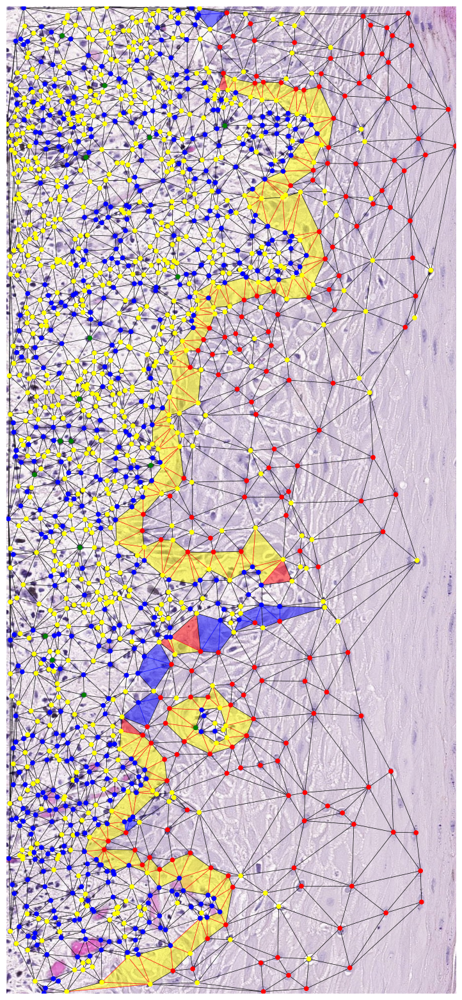

In [35]:
import matplotlib.patches as patches
labels = triangle_df['count'].values

# Create a figure and axis object
fig, ax = plt.subplots()

# Figure size 20,20
fig.set_size_inches(20, 20)


# Plot the image
ax.imshow(image)

if SHOW_PATCHES:
    show_patches(triangle_df, ax)


nx.draw(G, pos, node_size=20, width= 0.5, node_color=node_colors, edge_color=edge_colors )
# 
# Remove the axis ticks and labels
ax.set_xticks([])
ax.set_yticks([])

# Display the plot
plt.show()

## TRIANGLE GRAPH

In [36]:
# Get all the triangles to populate new graph
triangles_dict = dict()
for idx, row in triangle_df.iterrows():
    tmp = frozenset((row['Node1'],row['Node2'],row['Node3']))
    # add key label and x,y center points
    triangles_dict[tmp] = {'label': row['count'], 'x': (row['x1'] + row['x2'] + row['x3'])/3, 'y': (row['y1'] + row['y2'] + row['y3'])/3, 'idx' : idx}

triangle_graph = nx.Graph()

# Add nodes with labels for each triangle
pos_t = []
for i, triangle in enumerate(triangles_dict.keys()):
    triangle_graph.add_node(triangles_dict[triangle]['idx'], label=triangles_dict[triangle]['label'], triangle = triangle)
    pos_t.append([triangles_dict[triangle]['x'], triangles_dict[triangle]['y']])
# Add edges between triangles that share an edge
for triangle1, triangle2 in combinations(triangles_dict.keys(), 2):
    common_nodes = triangle1.intersection(triangle2)
    if len(common_nodes) == 2:
       triangle_graph.add_edge(triangles_dict[triangle1]['idx'], triangles_dict[triangle2]['idx'])


In [37]:
labels = triangle_df['count'].values
t_color = {0: 'white', 1: 'red', 2: 'yellow', 3: 'green', 4: 'blue'}
triangles_col = [t_color[labels[i]] for i in range(len(labels))]

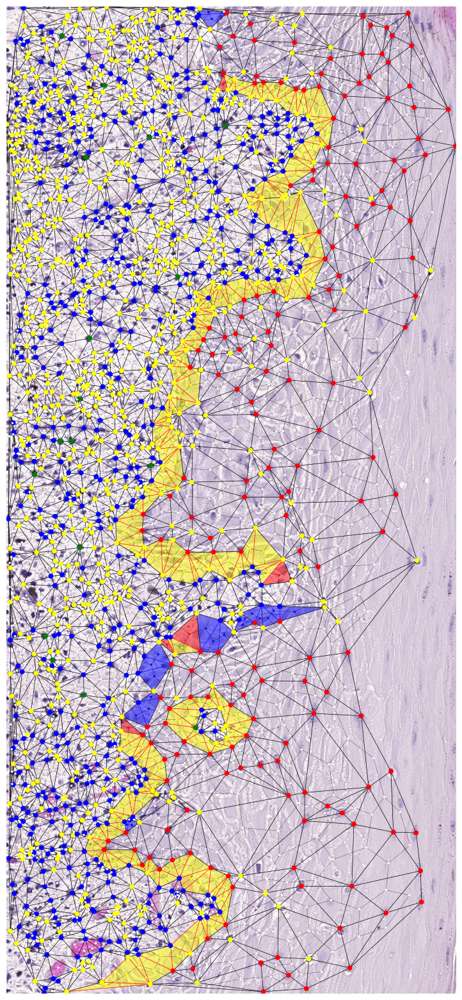

In [38]:
# Create a figure and axis object
fig, ax = plt.subplots()

# Figure size 20,20
fig.set_size_inches(20, 20)

# Plot the image
ax.imshow(image)

if SHOW_PATCHES:
    show_patches(triangle_df, ax)

if SHOW_CELL_GRAPH:
    nx.draw(G, pos, node_size=20, width= 0.5, node_color=node_colors, edge_color=edge_colors )
if SHOW_TRIANGLE_GRAPH:
    nx.draw(triangle_graph, pos_t, node_size=2, node_color=triangles_col, with_labels=False, width = 0.2)


# HEURISTIC

In [39]:
for i in range(6):
    for n in triangle_graph.nodes():

        if triangle_graph.nodes[n]['label'] == 1: # BREAKAGE == Starting point
            # Get the neighbors of the node
            neighbors = list(triangle_graph.neighbors(n))
            visit_list = []
            visit_list_blue = []
            for nn in neighbors: # Look for a triangle to extend the path
                if triangle_graph.nodes[nn]['label'] == 0: # Found the breakage to connect
                    visit_list.append(nn)
                elif triangle_graph.nodes[nn]['label'] == 1:
                    # Connect the two breakages
                    triangle_graph.nodes[nn]['label'] = 2
                    triangle_graph.nodes[n]['label'] = 2
                    
                elif triangle_graph.nodes[nn]['label'] == 2: # Do nothing
                    pass
                elif triangle_graph.nodes[nn]['label'] == 3: # Do nothing
                    pass
                elif triangle_graph.nodes[nn]['label'] == 4: # Revisit this later
                    visit_list_blue.append(nn)
                    pass
            if len(visit_list_blue) == 2:
                triangle_graph.nodes[n]['label'] = 2
            if len(visit_list) == 1:
                print('Found possible breakage')
                # if len of visit_list is 1, im not sure if it is a breakage or a continuation
                pass
            elif len(visit_list) == 2:
                print('Found a breakage')
                edge1 = triangle_graph.nodes[n]['triangle'] & triangle_graph.nodes[visit_list[0]]['triangle']
                edge2 = triangle_graph.nodes[n]['triangle'] & triangle_graph.nodes[visit_list[1]]['triangle']

                # Check the cells type of the edge
                gt1, gt2 = [], []
                for node in edge1:
                    gt1.append(nodes_df[nodes_df['id'] == node]['gt'].values[0])
                for node in edge2:
                    gt2.append(nodes_df[nodes_df['id'] == node]['gt'].values[0])

                if ('fibroblast and endothelial' in gt2) & ('epithelial' in gt2):
                    gt1, gt2 = gt2, gt1
                print(gt1, gt2)
                
                if gt1[0] != gt1[1]:
                    #expand this
                    # change the label of the triangle n to 10 and nn to 1
                    print('expanding..')
                    print(triangle_graph.nodes[n])
                    print(triangle_graph.nodes[visit_list[0]])
                    # Check the neighbors of the expansion
                    neigh_n_to_expand = triangle_graph.neighbors(visit_list[0]) 
                    
                    triangle_graph.nodes[n]['label'] = 4
                    triangle_graph.nodes[visit_list[0]]['label'] = 1
                    
                elif gt2[0] != gt2[1]:
                    #expand this
                    print('expanding..')
                    
                    print(triangle_graph.nodes[n])
                    print(triangle_graph.nodes[visit_list[1]])
                    triangle_graph.nodes[n]['label'] = 4
                    triangle_graph.nodes[visit_list[1]]['label'] = 1
                    
                    
                elif gt1[0] == gt1[1] and gt1[0] == 'lymphocyte':
                                    #expand this
                    print('expanding..')
                    
                    print(triangle_graph.nodes[n])
                    print(triangle_graph.nodes[visit_list[1]])
                    triangle_graph.nodes[n]['label'] = 4
                    triangle_graph.nodes[visit_list[1]]['label'] = 1

                elif gt2[0] == gt2[1] and gt2[0] == 'lymphocyte':
                                    #expand this
                    print('expanding..')
                    
                    print(triangle_graph.nodes[n])
                    print(triangle_graph.nodes[visit_list[1]])
                    triangle_graph.nodes[n]['label'] = 4
                    triangle_graph.nodes[visit_list[1]]['label'] = 1
                else:
                    # random or expand both or look...
                    pass
                
                

Found a breakage
['lymphocyte', 'lymphocyte'] ['lymphocyte', 'fibroblast and endothelial']
expanding..
{'label': 1.0, 'triangle': frozenset({632, 1212, 1232})}
{'label': 0.0, 'triangle': frozenset({632, 1206, 1232})}
Found a breakage
['lymphocyte', 'lymphocyte'] ['lymphocyte', 'epithelial']
expanding..
{'label': 1.0, 'triangle': frozenset({355, 1437, 1523})}
{'label': 0.0, 'triangle': frozenset({355, 389, 1437})}
Found a breakage
['fibroblast and endothelial', 'lymphocyte'] ['lymphocyte', 'lymphocyte']
expanding..
{'label': 1.0, 'triangle': frozenset({890, 1196, 606})}
{'label': 0.0, 'triangle': frozenset({1196, 606, 1199})}
Found possible breakage
Found a breakage
['epithelial', 'lymphocyte'] ['lymphocyte', 'lymphocyte']
expanding..
{'label': 1, 'triangle': frozenset({355, 389, 1437})}
{'label': 0.0, 'triangle': frozenset({1437, 389, 390})}
Found a breakage
['lymphocyte', 'epithelial'] ['lymphocyte', 'lymphocyte']
expanding..
{'label': 1.0, 'triangle': frozenset({1264, 60, 1310})}
{'l

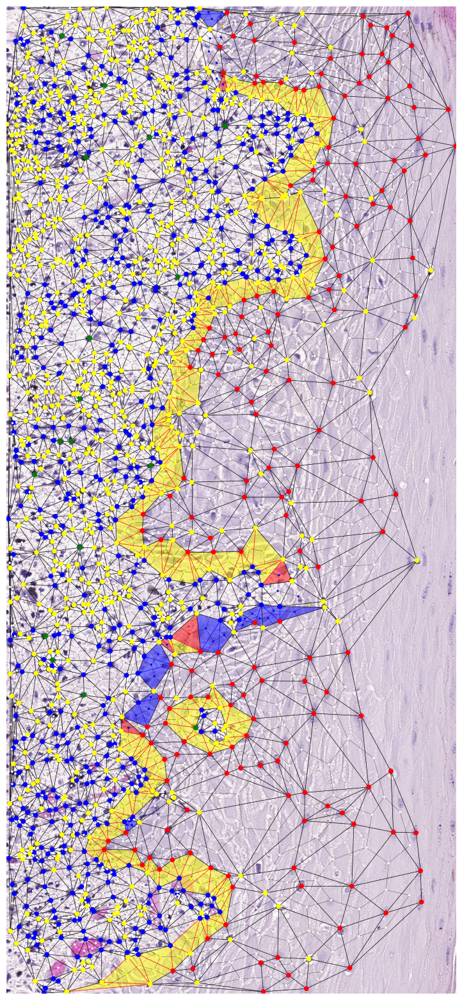

In [40]:
labels = [triangle_graph.nodes[n]['label'] for n in triangle_graph.nodes()]
triangles_col = [t_color[labels[i]] for i in range(len(labels))]
# Create a figure and axis object
fig, ax = plt.subplots()
# Figure size 20,20
fig.set_size_inches(20, 20)
# Plot the image
ax.imshow(image)

if SHOW_PATCHES:
    show_patches(triangle_df, ax)
if SHOW_CELL_GRAPH:
    nx.draw(G, pos, node_size=20, width= 0.5, node_color=node_colors, edge_color=edge_colors )
if SHOW_TRIANGLE_GRAPH:
    nx.draw(triangle_graph, pos_t, node_size=2, node_color=triangles_col, with_labels=False, width = 0.2)
    
# Remove the axis ticks and labels
ax.set_xticks([])
ax.set_yticks([])

# Display the plot
plt.show()

In [41]:
nodes_visited = []

for node, value in triangle_graph.nodes(data='label'):
    if value > 0:
        nodes_visited.append(node)
        
for u,v in triangle_graph.edges():
    if u in nodes_visited and v in nodes_visited:
        triangle_graph.edges[u,v]['label'] = 1
    else:
        triangle_graph.edges[u,v]['label'] = 0

# get all labels from graph nodes
edge_labels = [triangle_graph.edges[u,v]['label'] for u,v in triangle_graph.edges()]

bm_color = {0:'white', 1: 'blue'}# 
bm = [bm_color[l] for l in edge_labels]
bm_width = [1.5 if l else 0.1 for l in edge_labels]

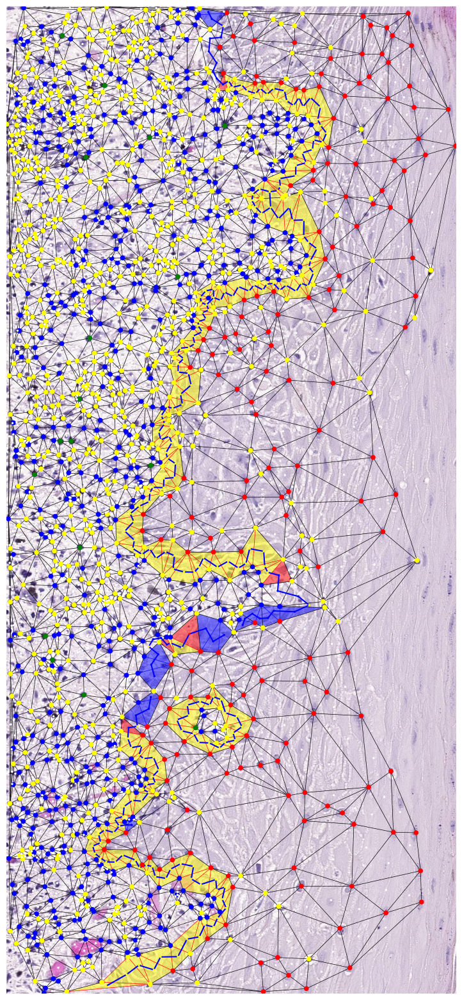

In [42]:


# Create a figure and axis object
fig, ax = plt.subplots()
# Figure size 20,20
fig.set_size_inches(20, 20)
# Plot the image
ax.imshow(image)


if SHOW_PATCHES:
    show_patches(triangle_df, ax)
if SHOW_CELL_GRAPH:
    nx.draw(G, pos, node_size=20, width= 0.5, node_color=node_colors, edge_color=edge_colors )

nx.draw(triangle_graph, pos_t, node_size=2, node_color=triangles_col, with_labels=False, width = bm_width, edge_color=bm)
 
ax.set_xticks([])
ax.set_yticks([])

# Display the plot
plt.show()

## FILL GAPS - attempt

In [ ]:
for n in triangle_graph.nodes():

    if triangle_graph.nodes[n]['label'] == 4: # BREAKAGE == Starting point
        # Get the neighbors of the node
        neighbors = list(triangle_graph.neighbors(n))
        visit_list = []
        visit_list_blue = []
        for nn in neighbors: # Look for a triangle to extend the path
            if triangle_graph.nodes[nn]['label'] == 0: # Found the breakage to connect
                visit_list.append(nn)
            elif triangle_graph.nodes[nn]['label'] == 1:
                # Connect the two breakages
                triangle_graph.nodes[nn]['label'] = 2
                triangle_graph.nodes[n]['label'] = 2
                
            elif triangle_graph.nodes[nn]['label'] == 2: # Do nothing
                pass
            elif triangle_graph.nodes[nn]['label'] == 3: # Do nothing
                pass
            elif triangle_graph.nodes[nn]['label'] == 4: # Revisit this later
                visit_list_blue.append(nn)
                pass
        if len(visit_list_blue) == 2:
            triangle_graph.nodes[n]['label'] = 2
        if len(visit_list) == 1:
            print('Found possible breakage')
            # if len of visit_list is 1, im not sure if it is a breakage or a continuation
            pass
        elif len(visit_list) == 2:
            print(visit_list)
            

            print('Found a breakage')
            edge1 = triangle_graph.nodes[n]['triangle'] & triangle_graph.nodes[visit_list[0]]['triangle']
            edge2 = triangle_graph.nodes[n]['triangle'] & triangle_graph.nodes[visit_list[1]]['triangle']
            print(edge1, edge2)

                  
            # Check the cells type of the edge
            gt1, gt2 = [], []
            for node in edge1:
                gt1.append(nodes_df[nodes_df['id'] == node]['gt'].values[0])
            for node in edge2:
                gt2.append(nodes_df[nodes_df['id'] == node]['gt'].values[0])

            if ('fibroblast and endothelial' in gt2) & ('epithelial' in gt2):
                gt1, gt2 = gt2, gt1
            print(gt1, gt2)

            
        # TODO: if ep-lym, ep-fib or both same, expand both with a tmp label, expand both tmp labels for two steps and match if something is found otherwise discard
            
            if gt1[0] != gt1[1]:
                #expand this
                # change the label of the triangle n to 10 and nn to 1
                print('expanding..')
                print(triangle_graph.nodes[n])
                print(triangle_graph.nodes[visit_list[0]])
                # Check the neighbors of the expansion
                neigh_n_to_expand = triangle_graph.neighbors(visit_list[0]) 
                
                triangle_graph.nodes[n]['label'] = 4
                triangle_graph.nodes[visit_list[0]]['label'] = 1
                
            elif gt2[0] != gt2[1]:
                #expand this
                print('expanding..')
                
                print(triangle_graph.nodes[n])
                print(triangle_graph.nodes[visit_list[1]])
                triangle_graph.nodes[n]['label'] = 4
                triangle_graph.nodes[visit_list[1]]['label'] = 1
                
                
            elif gt1[0] == gt1[1] and gt1[0] == 'lymphocyte':
                                #expand this
                print('expanding..')
                
                print(triangle_graph.nodes[n])
                print(triangle_graph.nodes[visit_list[1]])
                triangle_graph.nodes[n]['label'] = 4
                triangle_graph.nodes[visit_list[1]]['label'] = 1

            elif gt2[0] == gt2[1] and gt2[0] == 'lymphocyte':
                                #expand this
                print('expanding..')
                
                print(triangle_graph.nodes[n])
                print(triangle_graph.nodes[visit_list[1]])
                triangle_graph.nodes[n]['label'] = 4
                triangle_graph.nodes[visit_list[1]]['label'] = 1
            else:
                # random or expand both or look...
                pass
            
            

In [ ]:
labels = [triangle_graph.nodes[n]['label'] for n in triangle_graph.nodes()]
triangles_col = [t_color[labels[i]] for i in range(len(labels))]

In [ ]:
nodes_visited = []

for node, value in triangle_graph.nodes(data='label'):
    if value > 0:
        nodes_visited.append(node)
        
for u,v in triangle_graph.edges():
    if u in nodes_visited and v in nodes_visited:
        triangle_graph.edges[u,v]['label'] = 1
    else:
        triangle_graph.edges[u,v]['label'] = 0

# get all labels from graph nodes
edge_labels = [triangle_graph.edges[u,v]['label'] for u,v in triangle_graph.edges()]

bm_color = {0:'white', 1: 'blue'}# 
bm = [bm_color[l] for l in edge_labels]
bm_width = [1.5 if l else 0.1 for l in edge_labels]

In [ ]:
# Create a figure and axis object
fig, ax = plt.subplots()
# Figure size 20,20
fig.set_size_inches(20, 20)
# Plot the image
ax.imshow(image)


if SHOW_PATCHES:
    show_patches(triangle_df, ax)
if SHOW_CELL_GRAPH:
    nx.draw(G, pos, node_size=20, width= 0.5, node_color=node_colors, edge_color=edge_colors )

nx.draw(triangle_graph, pos_t, node_size=2, node_color=triangles_col, with_labels=False, width = bm_width, edge_color=bm)
 
ax.set_xticks([])
ax.set_yticks([])

# Display the plot
plt.show()